In [1]:
# Setting GPU-enabled Tensorflow
import tensorflow as tf

# physical_devices = tf.config.list_physical_devices('GPU') 
# for device in physical_devices:
#     tf.config.experimental.set_memory_growth(device, True)

# configuration = tf.compat.v1.ConfigProto()
# configuration.gpu_options.allow_growth = True
# session = tf.compat.v1.Session(config=configuration)
# set_session(session)

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
      print("sucessful")
  except RuntimeError as e:
    print(e)

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3610907123117003523
]


# Load Model


In [3]:
import os
import sys
import json
import random
import math
import re
import time
import skimage.draw
import numpy as np
import tensorflow as tf

# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

# Root directory of the project
ROOT_DIR = os.path.join(os.getcwd(), "Mask_RCNN-master")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
from mrcnn.config import Config
from mrcnn import model as modellib, utils

# %matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
WEIGHTS_PATH = os.path.join(ROOT_DIR, "logs", "object20220203T0753", "mask_rcnn_object_0010.h5")  # TODO: update this path

# # Path to trained weights file
# COCO_WEIGHTS_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# # Directory to save logs and model checkpoints
# DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")

class CustomConfig(Config):
    """Configuration for training on the dataset.
    Derives from the base Config class and overrides some values.
    """
    # Give the configuration a recognizable name
    NAME = "object"
    
    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    # IMAGES_PER_GPU = 2
    IMAGES_PER_GPU = 1
    # Number of classes (including background)
    NUM_CLASSES = 1 + 5  # Background + 5 paddy classes
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 100
    # Skip detections with < 70% confidence
    DETECTION_MIN_CONFIDENCE = 0.7

Using TensorFlow backend.


In [5]:
!python --version

Python 3.7.11


In [6]:
class CustomDataset(utils.Dataset):

    def load_custom(self, dataset_dir, subset):
        """Load a subset of the paddy dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("object", 1, "30days")
        self.add_class("object", 2, "50days")
        self.add_class("object", 3, "70days")
        self.add_class("object", 4, "90days")
        self.add_class("object", 5, "harvest")

        # Train or validation dataset?
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # We mostly care about the x and y coordinates of each region
        annotations1 = json.load(open(os.path.join(dataset_dir, "via_project.json")))
        print(annotations1)
        annotations = list(annotations1.values())  # don't need the dict keys

        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]
        
        # Add images
        # load each file one by one
        # a = annotation for a single image
        for a in annotations:
            print("a")
            print(a)
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. There are stores in the
            rectangle = [r['shape_attributes'] for r in a['regions']] 
            objects = [s['region_attributes']['name'] for s in a['regions']]
            print("objects:",objects)
            name_dict = {"30days": 1,"50days": 2,"70days": 3,"90days": 4,"harvest": 5} #,"xyz": 3}
            num_ids = [name_dict[a] for a in objects]
     
            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            print("numids",num_ids)
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "object",  ## for a single class just add the name here
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                rectangle=rectangle,
                num_ids=num_ids
                )

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a Horse/Man dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        if info["source"] != "object":
            return super(self.__class__, self).load_mask(image_id)
        num_ids = info['num_ids']
        # create a channel for each bounding box
        mask = np.zeros([info["height"], info["width"], len(info["rectangle"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["rectangle"]):
            # Get indexes of pixels inside the polygon and set them to 1
            x_start = p['x']
            y_start = p['y']
            width = p['width']
            height = p['height']

            mask[y_start:y_start+height, x_start:x_start+width, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        # Map class names to class IDs.
        num_ids = np.array(num_ids, dtype=np.int32)
        return mask, num_ids #np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "object":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [7]:
config = CustomConfig()

class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [8]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [9]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [30]:
# Load validation dataset
CUSTOM_DIR = os.path.join(os.getcwd(), 'dataset2')
dataset = CustomDataset()
dataset.load_custom(CUSTOM_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 20
Classes: ['BG', '30days', '50days', '70days', '90days', 'harvest']


In [11]:
# LOAD MODEL
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [12]:

# Load COCO weights, Or load the last model you trained
weights_path = WEIGHTS_PATH

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  d:\User\Coding Projects\Azure Mask RCNN\guangyi-8img-per-gpu\Mask_RCNN-master\logs\object20220203T0753\mask_rcnn_object_0010.h5






Re-starting from epoch 10


# Testing with custom image

1
Processing 1 images
image                    shape: (1500, 2000, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 2000.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32

*** No instances to display *** 



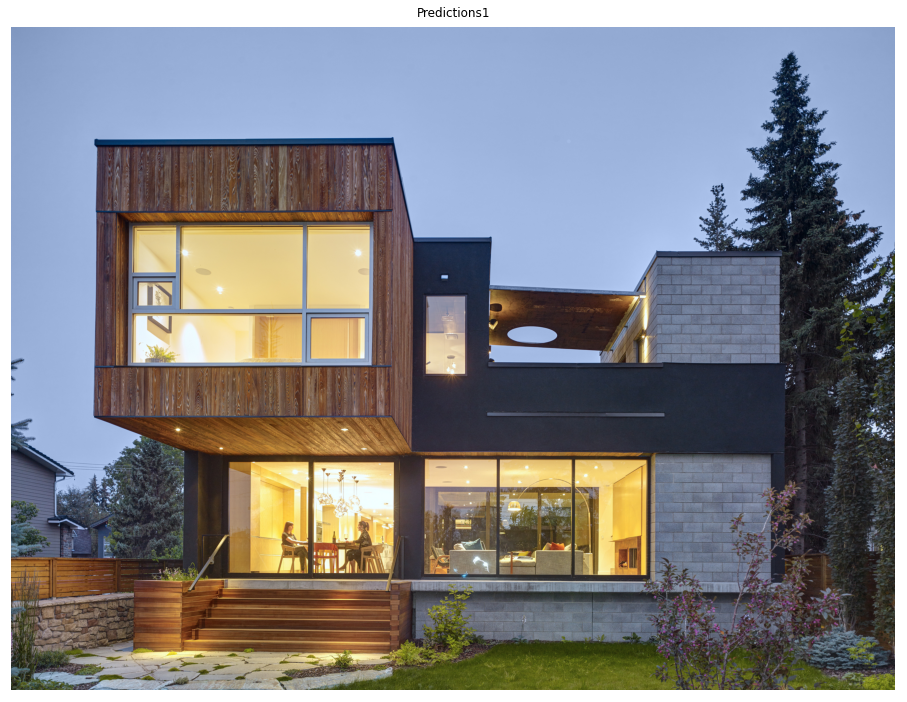

In [60]:
class_names = ['BG', '30 Days', '50 Days', '70 Days', '90 Days', 'Harvest']

TEST_IMAGE_DIR = os.path.join(os.getcwd(), 'NewHouse_SA_Photo_01.jpg')
image1 = mpimg.imread(TEST_IMAGE_DIR)

    # Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)

    # Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
                            class_names, r1['scores'], ax=ax,
                            title="Predictions1")

1
Processing 1 images
image                    shape: (4624, 3468, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  147.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 4624.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


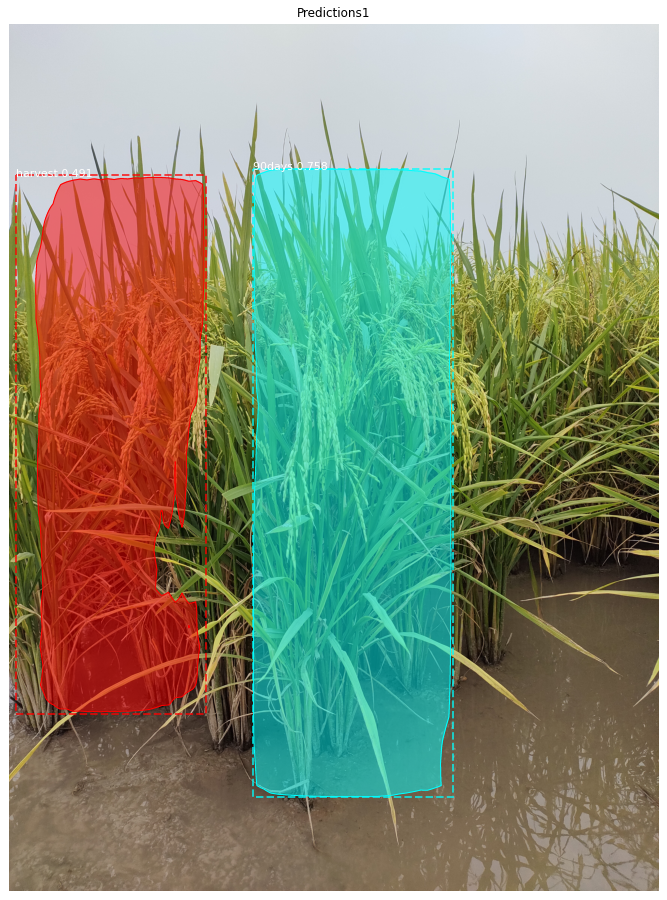

In [16]:
TEST_IMAGE_DIR = os.path.join(os.getcwd(), '90_days_0231.jpg')
image1 = mpimg.imread(TEST_IMAGE_DIR)

    # Run object detection
print(len([image1]))
results1 = model.detect([image1], verbose=1)

    # Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
                            dataset.class_names, r1['scores'], ax=ax,
                            title="Predictions1")

# Evaluation mAP

In [55]:
from mrcnn.model import mold_image
from numpy import expand_dims
from mrcnn.utils import compute_ap
from mrcnn.model import load_image_gt
from numpy import mean

# calculate the mAP for a model on a given dataset
def evaluate_model(dataset, model, cfg):
    APs = list()
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id, use_mini_mask=False)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0) 
        # extract results for first sample
        r = yhat[0]
        # calculate statistics, including AP
        AP, _, _, _ = compute_ap(gt_bbox, gt_class_id, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'], iou_threshold=0.9)
        # IOU threshold = 0.5
        APs.append(AP)
	# calculate the mean AP across all images
    mAP = mean(APs)
    return mAP

In [15]:
def getClass(class_ids, scores):
    """
    returns: prediction class with the highest confidence score
    """
    # convert numpy array type to list type to perform list operations
    class_ids = list(class_ids)
    scores = list(scores)

    max_confidence = max(scores)
    max_confidence_index = scores.index(max_confidence)
    return class_ids[max_confidence_index]

In [16]:
CUSTOM_DIR

'D:\\User\\Coding Projects\\Azure Mask RCNN\\dataset2'

In [17]:
def evaluate_classification(dataset, model, cfg):
    APs = list()
    total_count = 0
    correct_count = 0
    for image_id in dataset.image_ids:
        # load image, bounding boxes and masks for the image id
        image, image_meta, gt_class_id, gt_bbox, gt_mask = load_image_gt(dataset, cfg, image_id, use_mini_mask=False)
        # convert pixel values (e.g. center)
        scaled_image = mold_image(image, cfg)
        # convert image into one sample
        sample = expand_dims(scaled_image, 0)
        # make prediction
        yhat = model.detect(sample, verbose=0) 
        # extract results for first sample
        r = yhat[0]
        # calculate statistics, including AP
        total_count = total_count + 1
        if r["class_ids"].size != 0:
            prediction = getClass(r["class_ids"], r["scores"])

            if gt_class_id[0] == prediction:
                correct_count = correct_count + 1
	# calculate the mean AP across all images
    # mAP = mean(APs)
    accuracy = correct_count / total_count * 100
    return accuracy

In [20]:
dataset_dir = os.path.join(os.getcwd(), "dataset2")

dataset_train = CustomDataset()
dataset_train.load_custom(dataset_dir, "train")
dataset_train.prepare()

# Validation dataset
dataset_val = CustomDataset()
dataset_val.load_custom(dataset_dir, "val")
dataset_val.prepare()

# evaluate model on training dataset
train_mAP = evaluate_classification(dataset_train, model, config)
print("Train accuracy: %.3f" % train_mAP)
# evaluate model on test dataset
test_mAP = evaluate_classification(dataset_val, model, config)
print("Test accuracy: %.3f" % test_mAP)

Train accuracy: 63.750
Test accuracy: 50.000


In [16]:
# 8th epoch
# dataset_dir = os.path.join(os.getcwd(), "dataset2")
dataset_dir = 'D:\\User\\Coding Projects\\Azure Mask RCNN\\dataset3'

dataset_train = CustomDataset()
dataset_train.load_custom(dataset_dir, "train")
dataset_train.prepare()

# Validation dataset
dataset_val = CustomDataset()
dataset_val.load_custom(dataset_dir, "val")
dataset_val.prepare()

# evaluate model on training dataset
train_mAP = evaluate_model(dataset_train, model, config)
print("Train mAP: %.3f" % train_mAP)
# evaluate model on test dataset
test_mAP = evaluate_model(dataset_val, model, config)
print("Test mAP: %.3f" % test_mAP)

Train mAP: 0.648
Test mAP: 0.479


image ID: object.70_days_06.jpg (4) d:\User\Coding Projects\Paddy Class Prediction with Mask RCNN\test5\val\70_days_06.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (1, 4)                min:    6.00000  max:  995.00000  int32
gt_mask                  shape: (1024, 1024, 1)       min:    0.00000  max:    1.00000  uint8
AP 0.5
precisions [0.5 0.5 0.5 0. ]
recalls [0. 0. 1. 1.]
overlaps [[0.11553871]
 [0.58267075]]


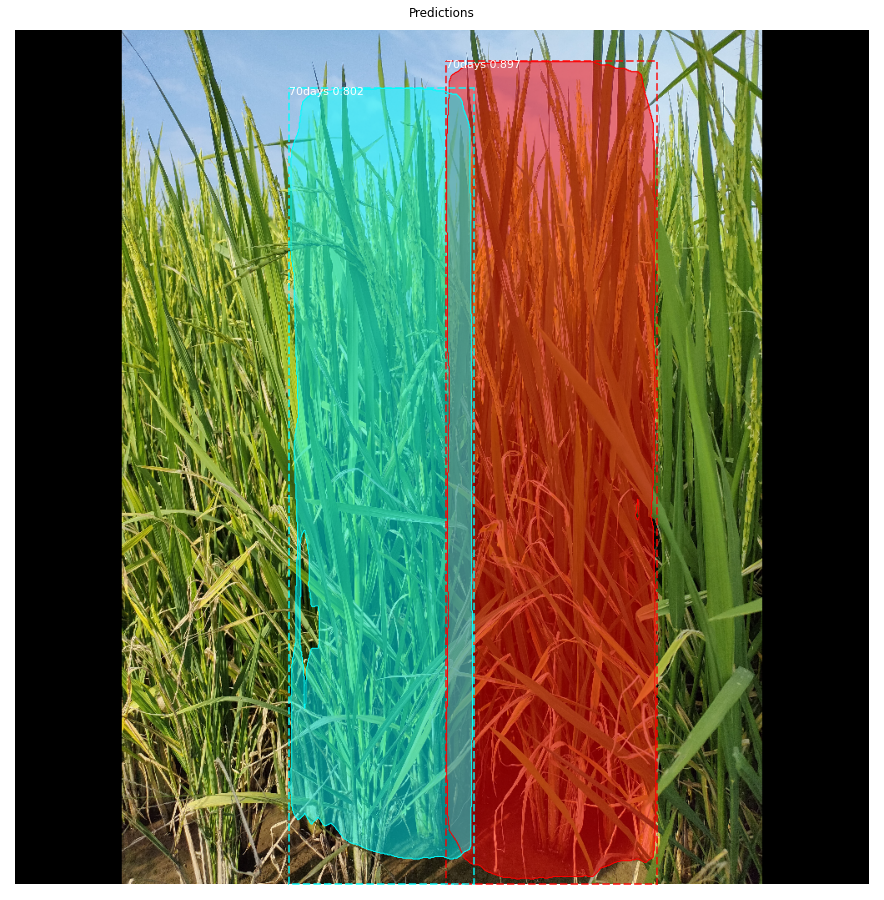

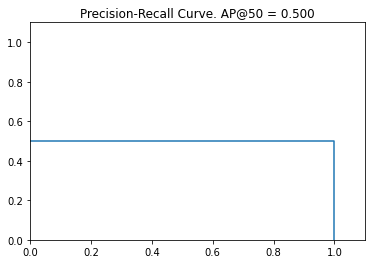

In [26]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
print("AP", AP)
print("precisions", precisions)
print("recalls", recalls)
print("overlaps", overlaps)
visualize.plot_precision_recall(AP, precisions, recalls)

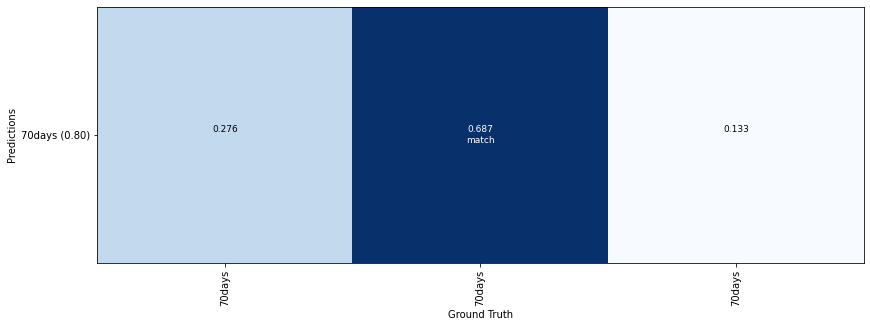

In [45]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

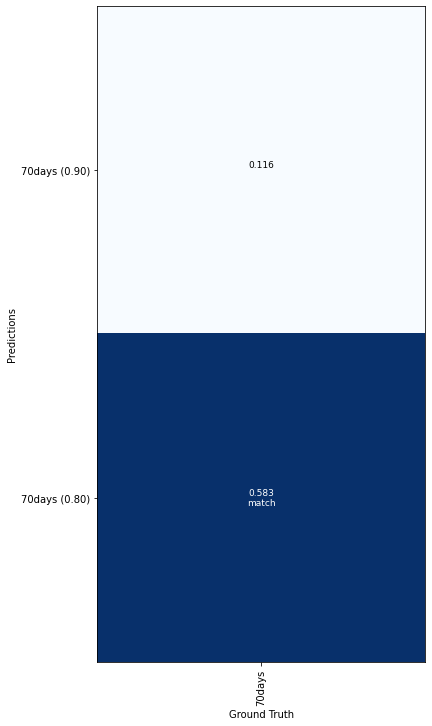

In [64]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

image ID: object.30_days_0100.jpg (15) D:\User\Coding Projects\Azure Mask RCNN\dataset2\train\30_days_0100.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (5,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (5, 4)                min:   34.00000  max:  996.00000  int32
gt_mask                  shape: (1024, 1024, 5)       min:    0.00000  max:    1.00000  uint8


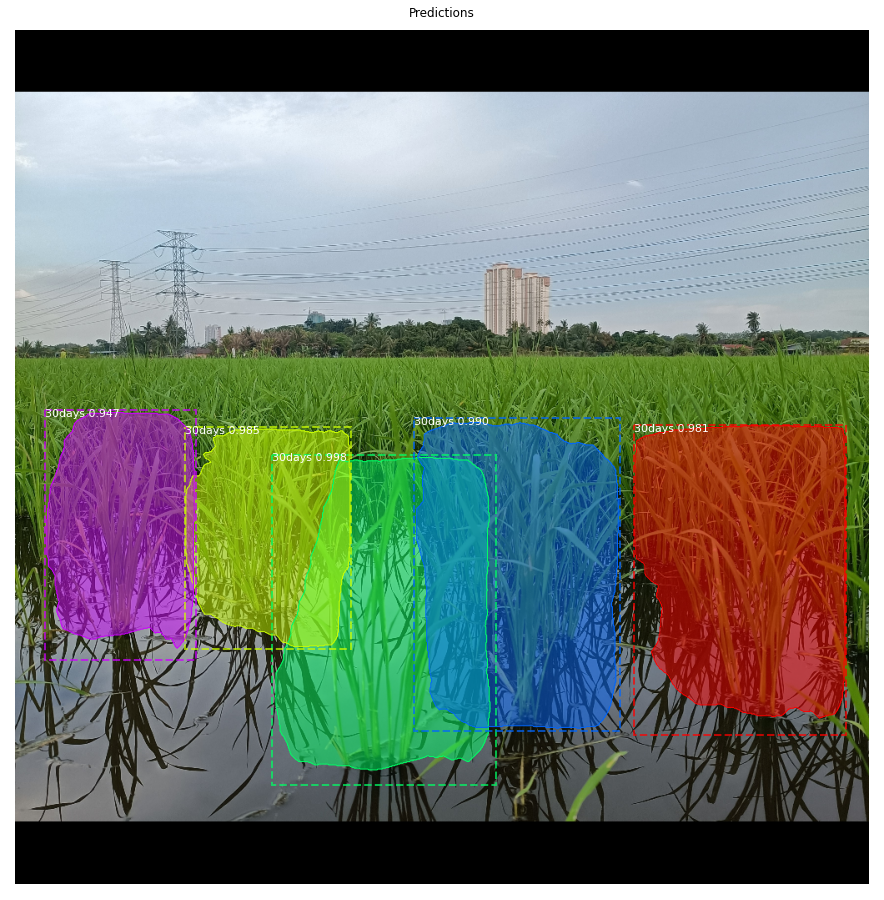

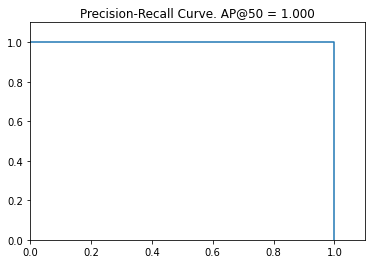

In [49]:
# image_id = random.choice(dataset.image_ids)
# image_id = random.choice(dataset_train.image_ids)
image_id = 15
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_train, config, image_id, use_mini_mask=False)
info = dataset_train.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset_train.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_train.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
visualize.plot_precision_recall(AP, precisions, recalls)

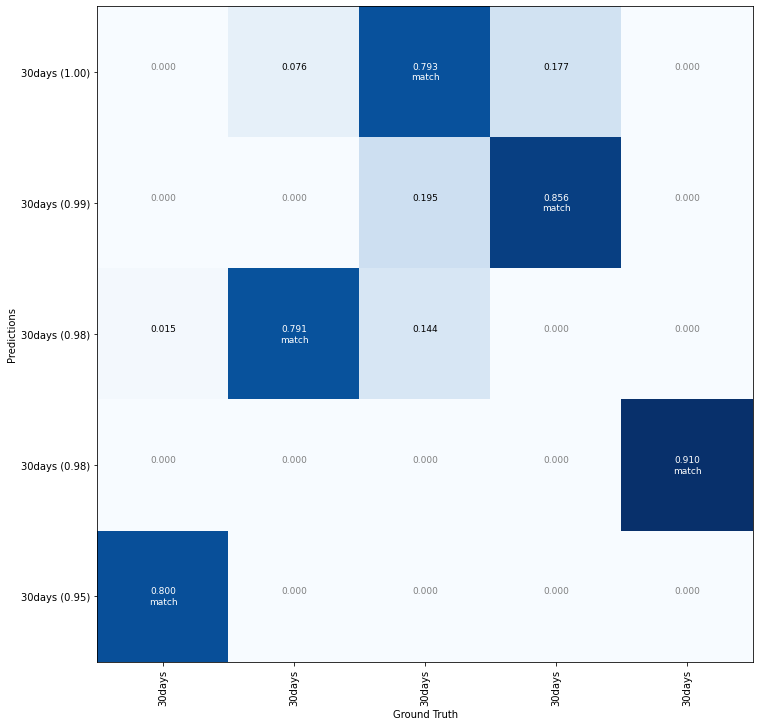

In [50]:
# Grid of ground truth objects and their predictions
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset_train.class_names)

# Plot Ground Truth vs Predicted

In [36]:
from matplotlib.patches import Rectangle
from matplotlib import pyplot

# plot a number of photos with ground truth and predictions
# def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
	# load image and mask
	for i in range(n_images):
		# load the image and mask
		image = dataset.load_image(i)
		mask, _ = dataset.load_mask(i)
		# convert pixel values (e.g. center)
		scaled_image = mold_image(image, cfg)
		# convert image into one sample
		sample = expand_dims(scaled_image, 0)
		# make prediction
		yhat = model.detect(sample, verbose=0)[0]
		# define subplot
		# f, axs = plt.subplots(2,2,figsize=(15,15))
		pyplot.figure(figsize=(75,75)) #changed
		pyplot.subplot(n_images, 2, i*2+1)
		# pyplot.subplot(n_images, 2, i*2+1, figsize=(18, 2))
		# plot raw pixel data
		pyplot.imshow(image)
# 		fig, ax = subplots(figsize=(18, 2))
# ax.imshow(random.rand(8, 90), interpolation='nearest')
# tight_layout()
		pyplot.title('Actual')
		# plot masks
		for j in range(mask.shape[2]):
			pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
		# get the context for drawing boxes
		pyplot.subplot(n_images, 2, i*2+2)
		# plot raw pixel data
		pyplot.imshow(image)
		pyplot.title('Predicted')
		ax = pyplot.gca()
		# plot each box
		for box in yhat['rois']:
			# get coordinates
			y1, x1, y2, x2 = box
			# calculate width and height of the box
			width, height = x2 - x1, y2 - y1
			# create the shape
			rect = Rectangle((x1, y1), width, height, fill=False, color='red')
			# draw the box
			ax.add_patch(rect)
	# show the figure
	pyplot.show()

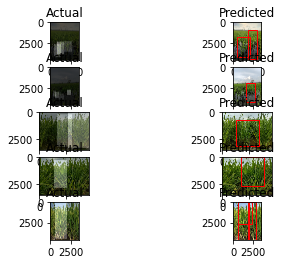

In [40]:
plot_actual_vs_predicted(dataset_val, model, config)

In [ ]:
dataset_dir = 'D:\\User\\Coding Projects\\Azure Mask RCNN\\dataset2'

dataset_train = CustomDataset()
dataset_train.load_custom(dataset_dir, "train")
dataset_train.prepare()

In [51]:
from matplotlib.patches import Rectangle
from matplotlib import pyplot

# plot a number of photos with ground truth and predictions
# def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
def plot_actual_vs_predicted(dataset, model, cfg, n_images=1):
	# load image and mask
	for i in range(n_images):
		# load the image and mask
		image = dataset.load_image(15)
		mask, _ = dataset.load_mask(15)
		# convert pixel values (e.g. center)
		scaled_image = mold_image(image, cfg)
		# convert image into one sample
		sample = expand_dims(scaled_image, 0)
		# make prediction
		yhat = model.detect(sample, verbose=0)[0]
		# define subplot
		# f, axs = plt.subplots(2,2,figsize=(15,15))
		pyplot.figure(figsize=(15, 15)) #changed
		pyplot.subplot(n_images, 2, i*2+1)
		# pyplot.subplot(n_images, 2, i*2+1, figsize=(18, 2))
		# plot raw pixel data
		pyplot.imshow(image)
		pyplot.title('Actual')
		# plot masks
		for j in range(mask.shape[2]):
			pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
		# get the context for drawing boxes
		pyplot.subplot(n_images, 2, i*2+2)
		# plot raw pixel data
		pyplot.imshow(image)
		pyplot.title('Predicted')
		ax = pyplot.gca()
		# plot each box
		for box in yhat['rois']:
			# get coordinates
			y1, x1, y2, x2 = box
			# calculate width and height of the box
			width, height = x2 - x1, y2 - y1
			# create the shape
			rect = Rectangle((x1, y1), width, height, fill=False, color='red')
			# draw the box
			ax.add_patch(rect)
	# show the figure
	pyplot.show()

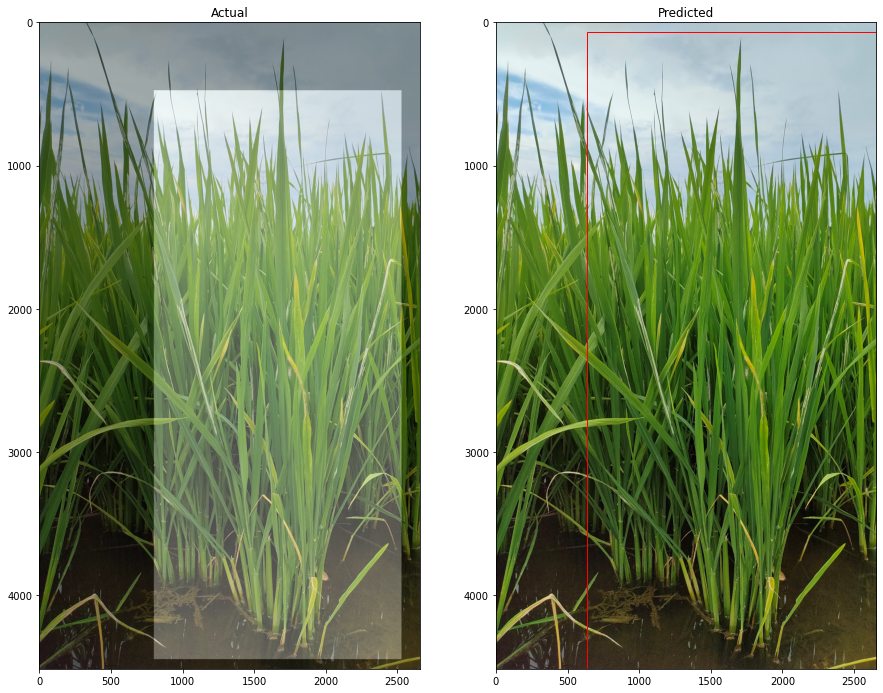

In [40]:
# 50 days
plot_actual_vs_predicted(dataset_train, model, config)


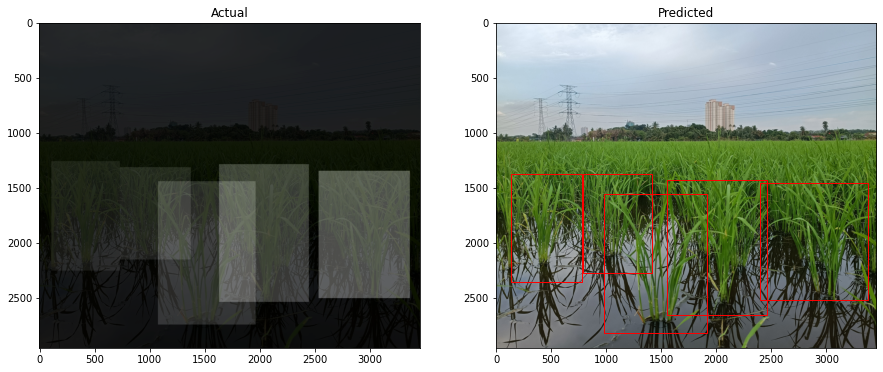

In [52]:
# 30 days
plot_actual_vs_predicted(dataset_train, model, config)


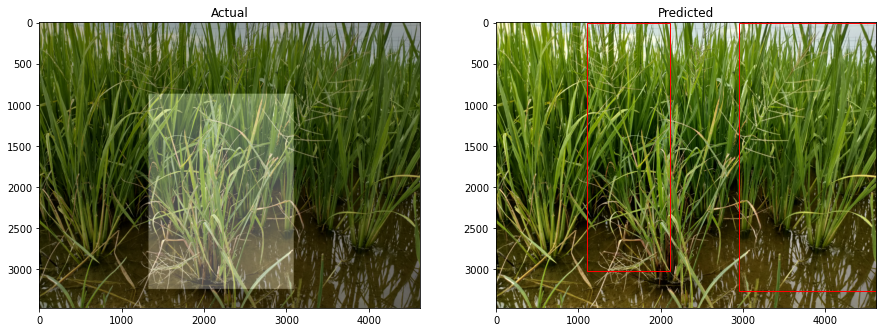

In [52]:
#70 days
plot_actual_vs_predicted(dataset_train, model, config)


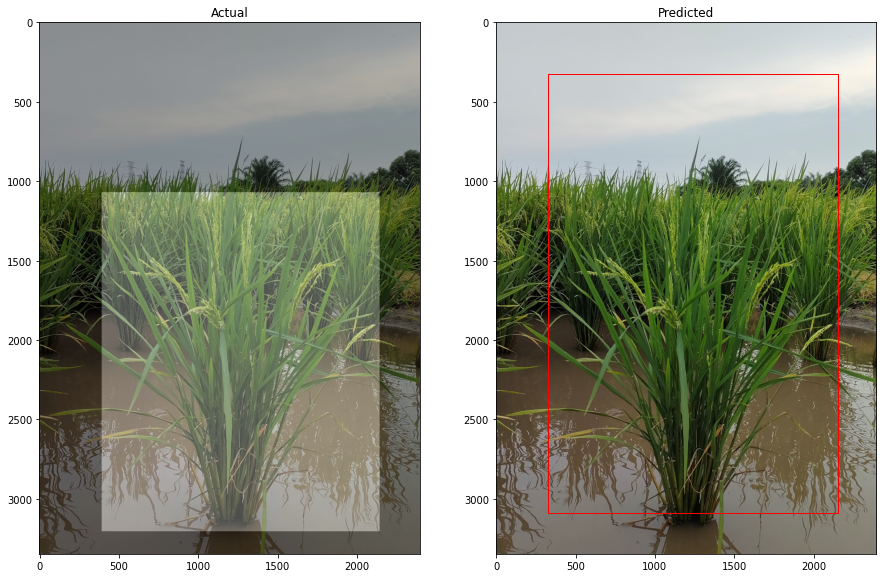

In [46]:
# 90 days
plot_actual_vs_predicted(dataset_train, model, config)


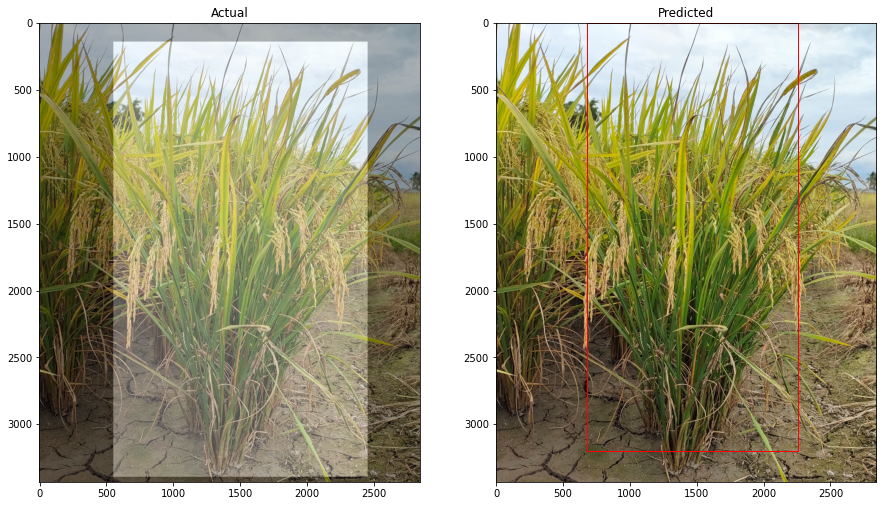

In [48]:
# harvest
plot_actual_vs_predicted(dataset_train, model, config)


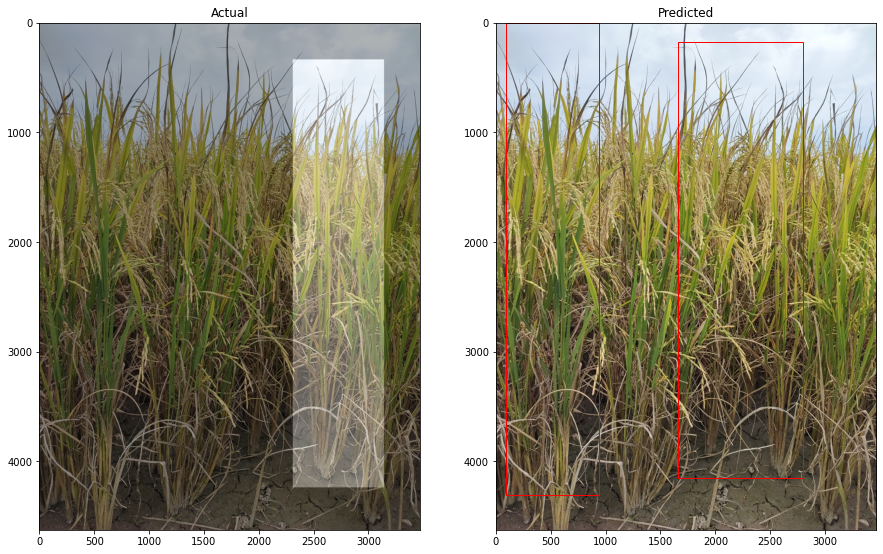

In [58]:
# harvest
plot_actual_vs_predicted(dataset_train, model, config)


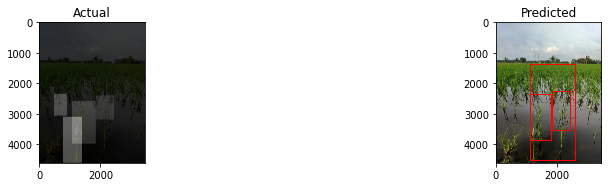

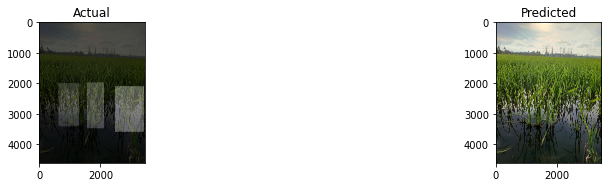

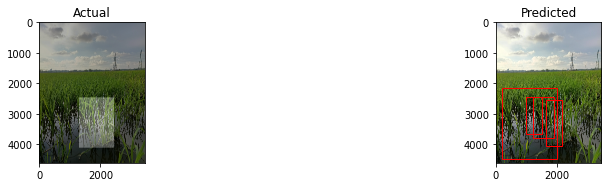

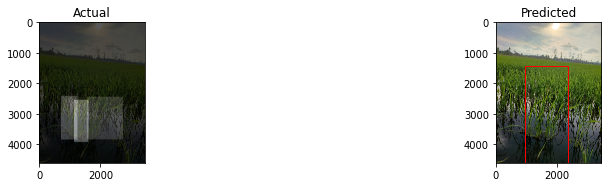

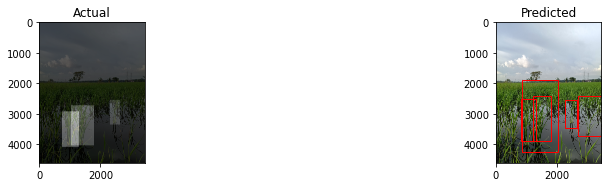

In [48]:
plot_actual_vs_predicted(dataset_train, model, config)


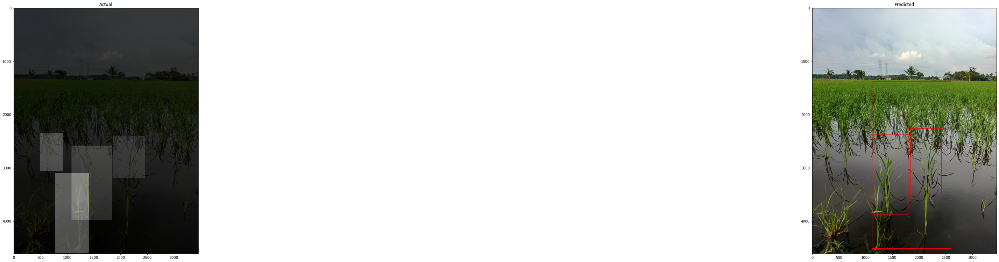

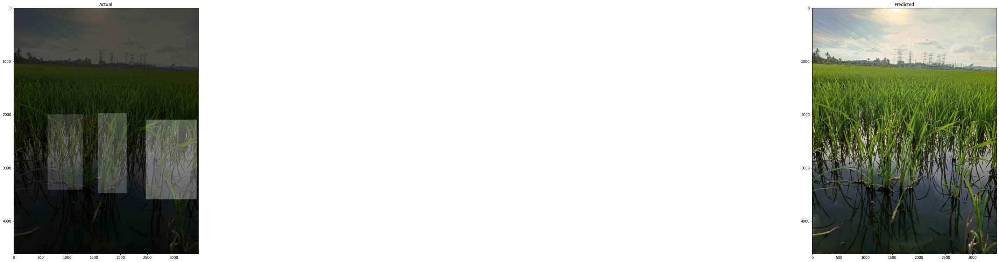

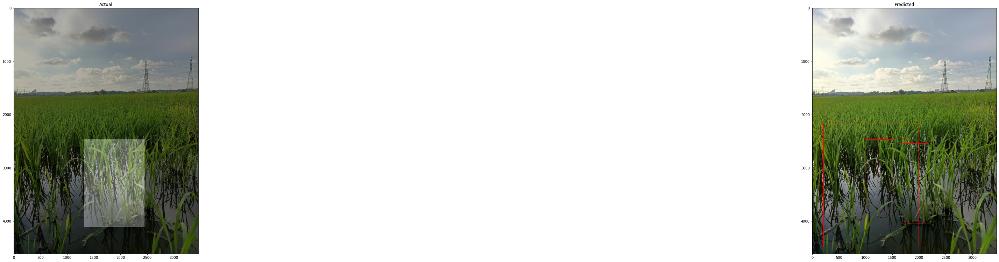

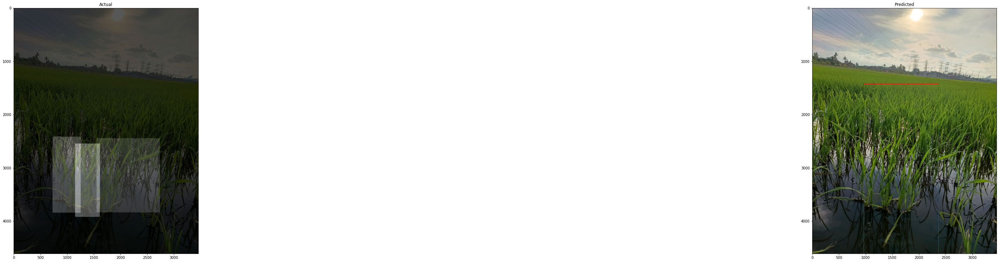

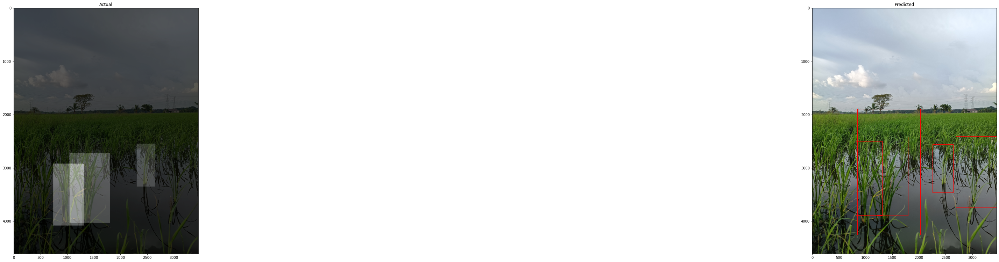

In [50]:
plot_actual_vs_predicted(dataset_train, model, config)


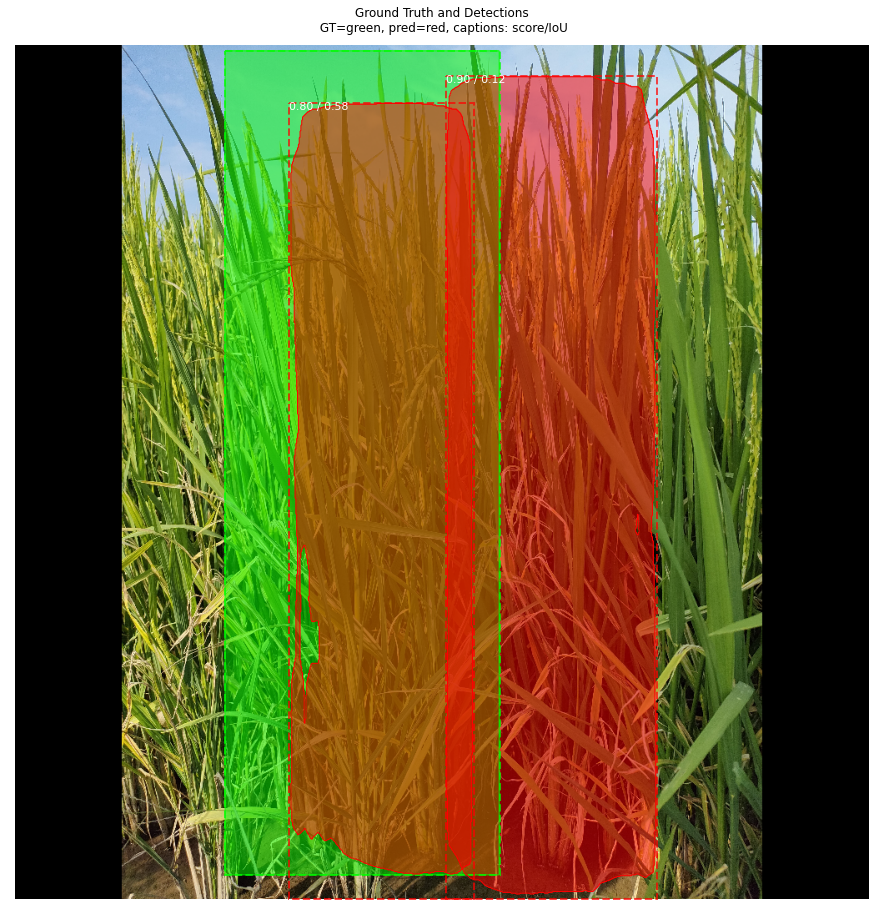

In [60]:
visualize.display_differences(
    image,
    gt_bbox, gt_class_id, gt_mask,
    r['rois'], r['class_ids'], r['scores'], r['masks'],
    dataset.class_names, ax=get_ax(),
    show_box=True, show_mask=True,
    iou_threshold=0.5, score_threshold=0.5)